read datasets and barchart


             RAN   RFY   DMN   DSA   EYS  EEC  BMF   BSQ  CYK  CGV  ...  YGE  \
Date                                                                ...        
2021-01-01  2322  2374  2004  1086  1102  917  927  1023  830  811  ...   71   
2021-01-02  2034  2070  1549   978   977  939  994   865  779  853  ...   63   
2021-01-03  1655  1835  1010   932   832  835  785   731  710  673  ...   60   
2021-01-04  2039  1813  1456   904   892  776  884   822  639  758  ...   45   
2021-01-05  2006  1996  1412   851   925  734  924   605  643  745  ...   82   

            XSB  HNV  IZX  HTF  ZSJ  YMQ  ZYT  AGN  ZMY  
Date                                                     
2021-01-01    0   72   84   96    0    0   74    0    0  
2021-01-02    0   78   83   91    0    0   61    0    0  
2021-01-03    0   61   68   77    0    0   76    0    0  
2021-01-04    0   73  106   93    0    0   65    0    0  
2021-01-05    0   54   79   69    0    0   80    0    0  

[5 rows x 45 columns]
     Overh

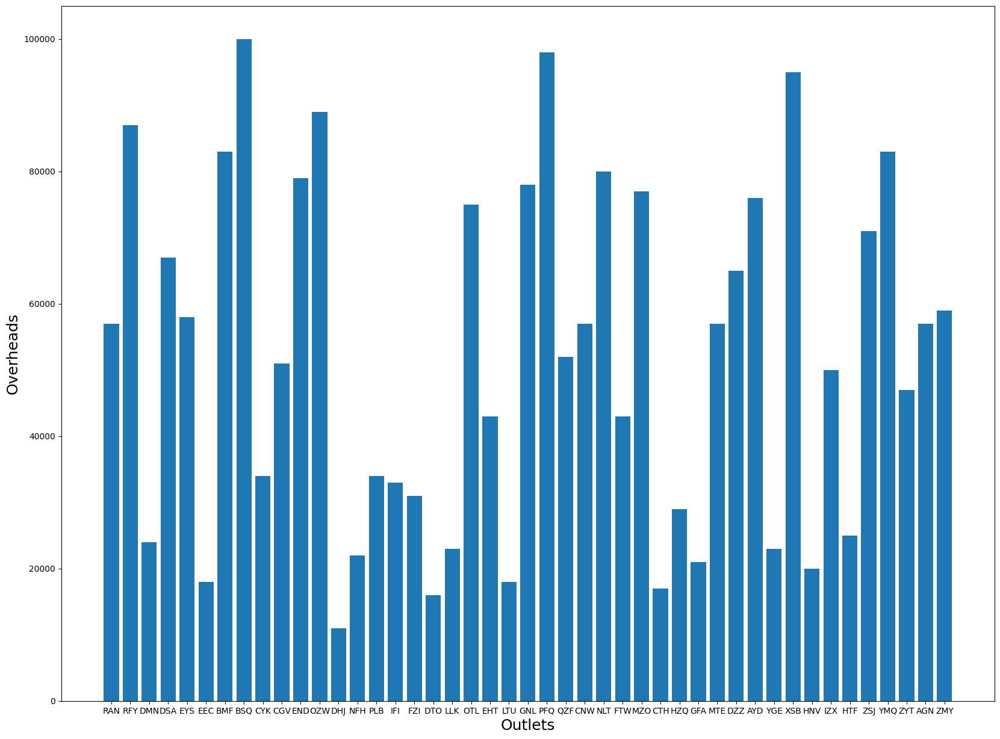

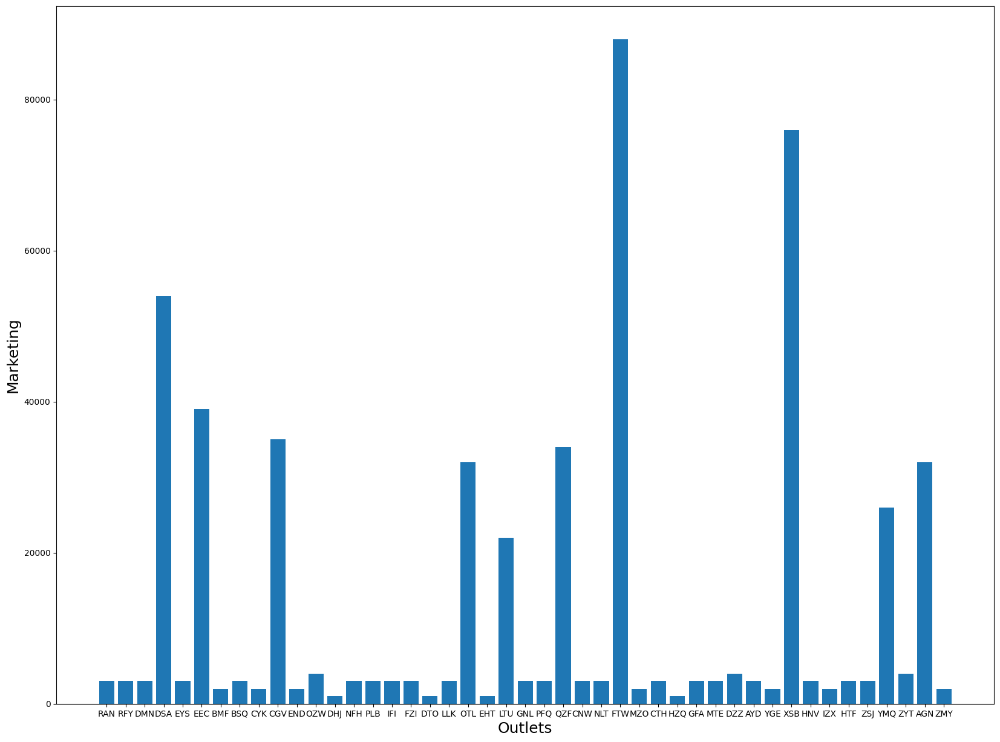

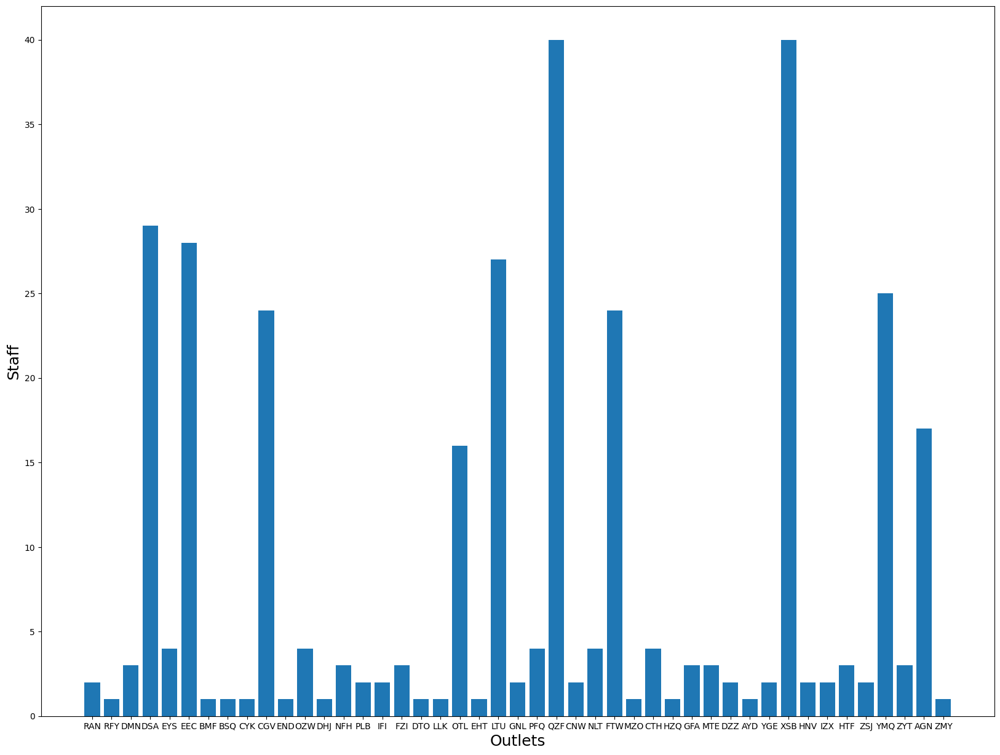

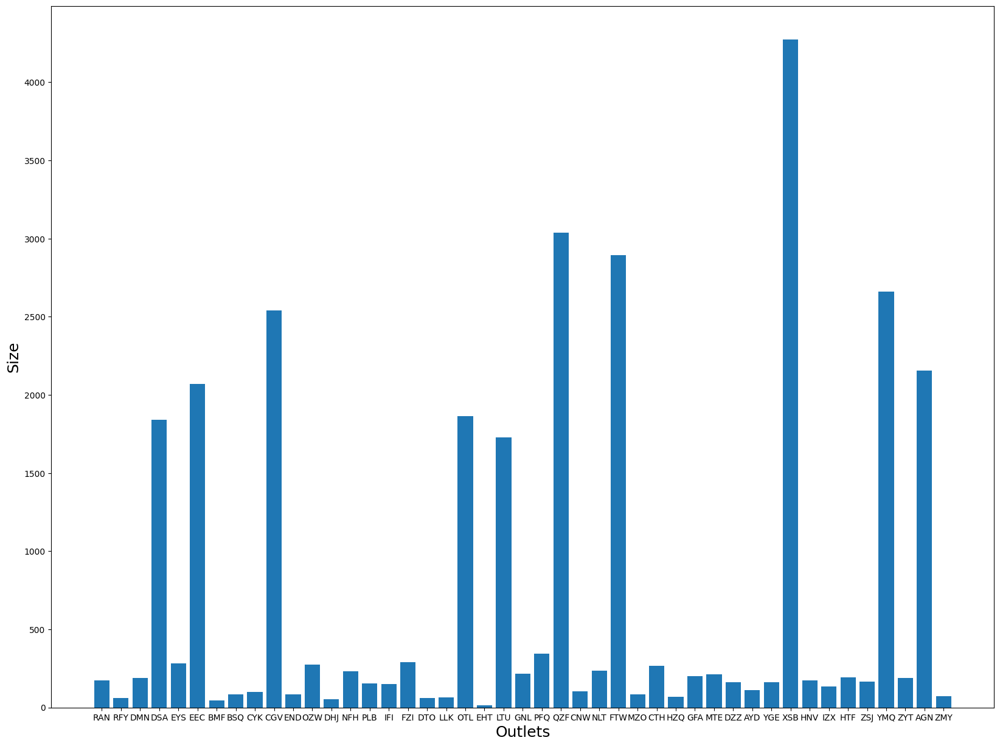

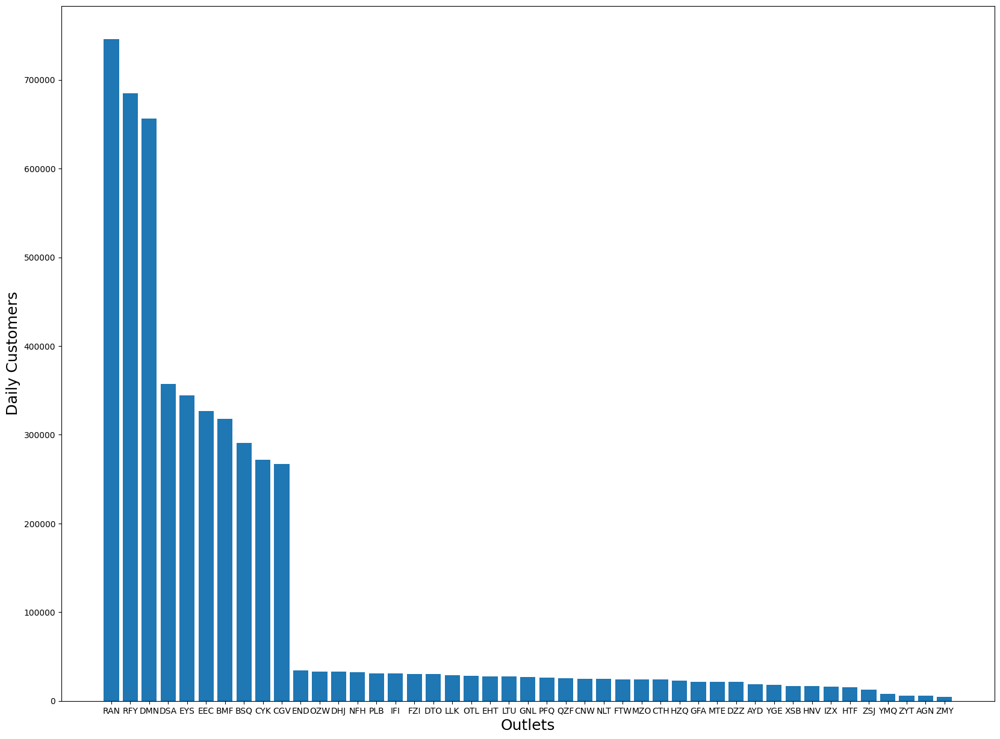

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

data = pd.read_csv('https://raw.githubusercontent.com/ChrisWalshaw/DataViz/master/Data/001255924/OutletDailyCustomers.csv', index_col=0)
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)

print(data.head())

OutletMarketing_data = pd.read_csv('https://raw.githubusercontent.com/ChrisWalshaw/DataViz/master/Data/001255924/OutletMarketing.csv', index_col=0)
OutletStaff_data = pd.read_csv('https://raw.githubusercontent.com/ChrisWalshaw/DataViz/master/Data/001255924/OutletStaff.csv', index_col=0)
OutletSize_data = pd.read_csv('https://raw.githubusercontent.com/ChrisWalshaw/DataViz/master/Data/001255924/OutletSize.csv', index_col=0)
OutletOverhead_data=pd.read_csv('https://raw.githubusercontent.com/ChrisWalshaw/DataViz/master/Data/001255924/OutletOverheads.csv', index_col=0)

summary_data = pd.DataFrame(index=data.columns)
summary_data['Overheads'] = OutletOverhead_data.values
summary_data['Marketing'] = OutletMarketing_data.values
summary_data['Staff'] = OutletStaff_data.values
summary_data['Size'] = OutletSize_data.values
summary_data['Daily Customers'] = data.sum(axis=0).values





print(summary_data.head())
print(summary_data.describe())

for attribute in summary_data:
    plt.figure(figsize=(20, 15))
    x_pos = np.arange(len(summary_data.index))
    plt.bar(x_pos, summary_data[attribute], align='center')
    plt.xticks(x_pos, summary_data.index)
    plt.xlabel('Outlets', fontsize=18)
    plt.ylabel(attribute, fontsize=18)
    plt.show()


normalising data


In [29]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

     Overheads  Marketing  Staff      Size  Daily Customers
RAN       0.57   0.034091  0.050  0.040234         1.000000
RFY       0.87   0.034091  0.025  0.014269         0.917722
DMN       0.24   0.034091  0.075  0.044211         0.879496
DSA       0.67   0.613636  0.725  0.430643         0.479152
EYS       0.58   0.034091  0.100  0.065965         0.461782


In [30]:
# Calculate the average and standard deviation of daily customers
avg_daily_customers = np.mean(data.values)
std_daily_customers = np.std(data.values)

In [31]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

     Overheads  Marketing  Staff      Size  Daily Customers
RAN       0.57   0.034091  0.050  0.040234         1.000000
RFY       0.87   0.034091  0.025  0.014269         0.917722
DMN       0.24   0.034091  0.075  0.044211         0.879496
DSA       0.67   0.613636  0.725  0.430643         0.479152
EYS       0.58   0.034091  0.100  0.065965         0.461782


barchart for daily customers and different outlets. (high volumes, low volumes and medium valumes)

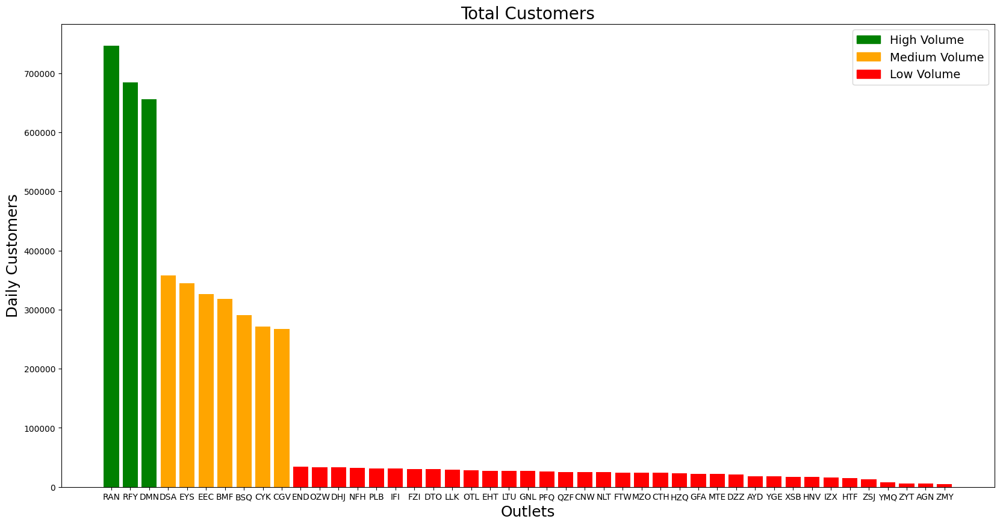

In [58]:
# this is Lecture 02 - example "07BarChart all coloured.py" adapted
import matplotlib.patches as mpatche
colours = []
for name in data.columns:
    total_sales = data[name].sum()
    if total_sales > 500000: ################## changed
        colour = 'green'
    elif total_sales > 100000: ################ changed
        colour = 'orange'
    elif total_sales > 0: ##################### changed
        colour = 'red'
    else:
        colour = 'black'
    colours.append(colour)
high_colour = mpatches.Patch(color='green', label='High Volume')
medium_colour = mpatches.Patch(color='orange', label='Medium Volume')
low_colour = mpatches.Patch(color='red', label='Low Volume')

plt.figure(figsize=(20, 10))
x_pos = np.arange(len(data.columns))
plt.bar(x_pos, data.sum(), align='center', color=colours)
plt.xticks(x_pos, data.columns) ## rotated
plt.xlabel('Outlets', fontsize=18) ############ changed
plt.ylabel('Daily Customers', fontsize=18) ########## changed
plt.title('Total Customers', fontsize=20) ##### changed
plt.legend(handles=[high_colour, medium_colour, low_colour], fontsize=14)
plt.show()


creating bar charts for different volumes

outletRAN is High volume
outletRFY is High volume
outletDMN is High volume
outletDSA is Medium volume
outletEYS is Medium volume
outletEEC is Medium volume
outletBMF is Medium volume
outletBSQ is Medium volume
outletCYK is Medium volume
outletCGV is Medium volume
outletEND is Low volume
outletOZW is Low volume
outletDHJ is Low volume
outletNFH is Low volume
outletPLB is Low volume
outletIFI is Low volume
outletFZI is Low volume
outletDTO is Low volume
outletLLK is Low volume
outletOTL is Low volume
outletEHT is Low volume
outletLTU is Low volume
outletGNL is Low volume
outletPFQ is Low volume
outletQZF is Low volume
outletCNW is Low volume
outletNLT is Low volume
outletFTW is Low volume
outletMZO is Low volume
outletCTH is Low volume
outletHZQ is Low volume
outletGFA is Low volume
outletMTE is Low volume
outletDZZ is Low volume
outletAYD is Low volume
outletYGE is Low volume
outletXSB is Low volume
outletHNV is Low volume
outletIZX is Low volume
outletHTF is Low volume
outletZSJ is Low

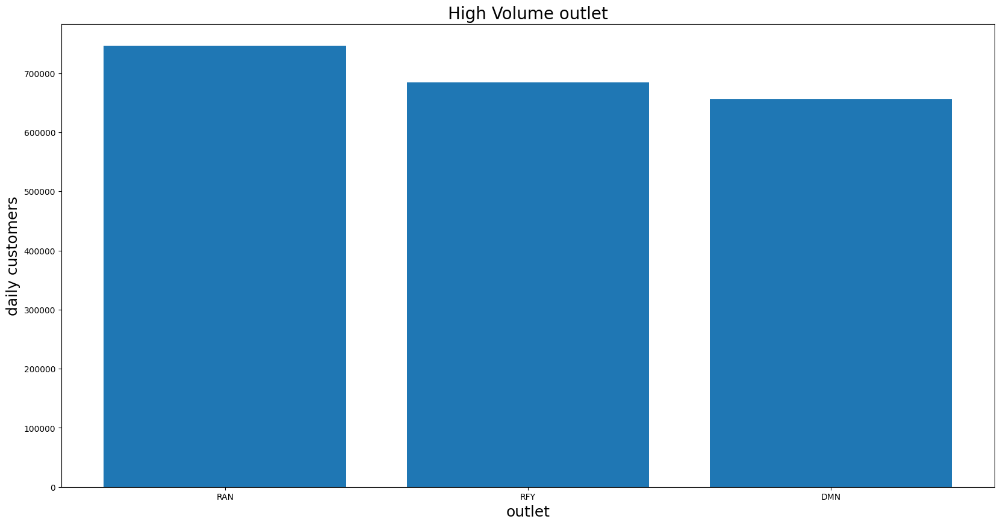

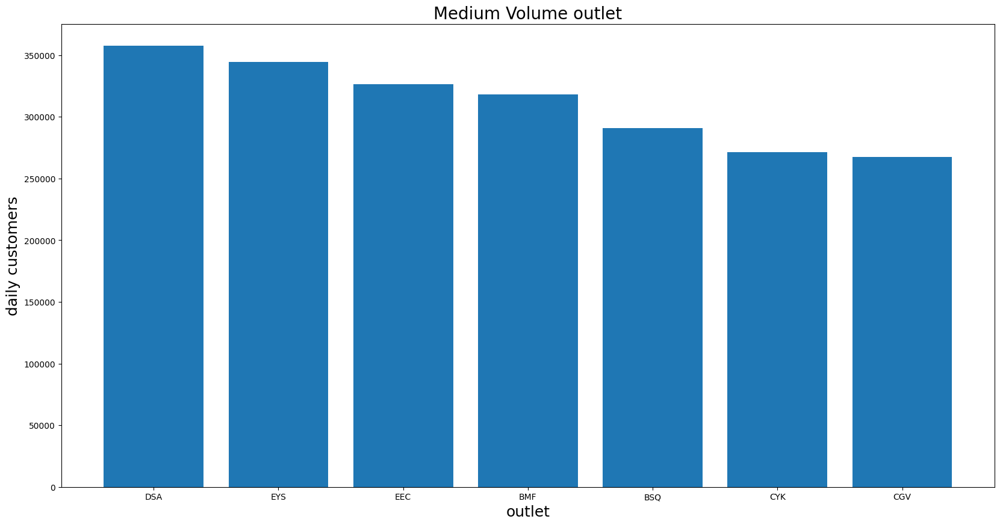

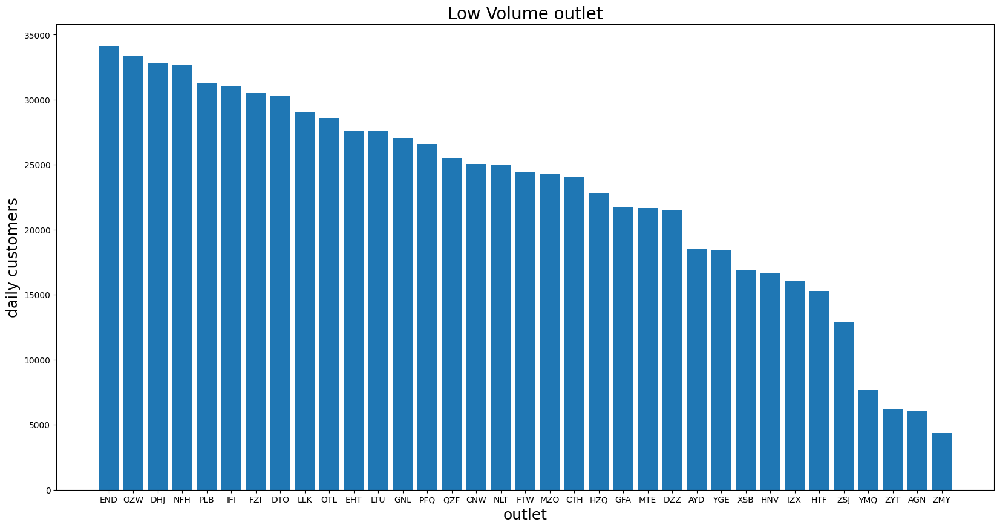

In [33]:
categories = ['High', 'Medium', 'Low']
categories_selected = [[] for i in range(len(categories))]
for name in data.columns:
    total_sales = data[name].sum()
    if total_sales > 400000:
        category = 0
    elif total_sales > 50000:
        category = 1
    else:
        category = 2
    categories_selected[category].append(name)
    print('outlet' + name + ' is ' + categories[category] + ' volume')

for i in range(len(categories)):
    print(categories[i] + ': ' + str(categories_selected[i]))

for i, selected in enumerate(categories_selected):
    plt.figure(figsize=(20, 10))
    x_pos = np.arange(len(data[selected].columns))
    plt.bar(x_pos, data[selected].sum(), align='center')
    plt.xticks(x_pos, data[selected].columns)
    plt.xlabel('outlet', fontsize=18)
    plt.ylabel('daily customers', fontsize=18)
    plt.title(categories[i] + ' Volume outlet', fontsize=20)
    plt.show()


line charts

             RAN   RFY   DMN   DSA   EYS  EEC  BMF   BSQ  CYK  CGV
Date                                                              
2021-01-01  2322  2374  2004  1086  1102  917  927  1023  830  811
2021-01-02  2034  2070  1549   978   977  939  994   865  779  853
2021-01-03  1655  1835  1010   932   832  835  785   731  710  673
2021-01-04  2039  1813  1456   904   892  776  884   822  639  758
2021-01-05  2006  1996  1412   851   925  734  924   605  643  745


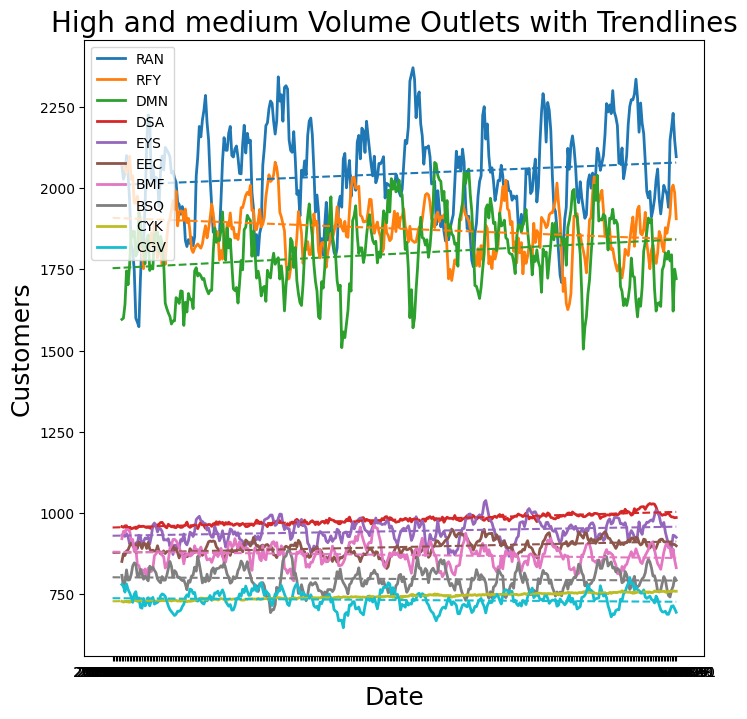

In [34]:
period = 7
rolling_average = data.rolling(window=period).mean()


selected=['RAN', 'RFY', 'DMN','DSA', 'EYS', 'EEC','BMF','BSQ','CYK','CGV'] ################################# changed
print(data[selected].head())

plt.figure(figsize=(8, 8))
# plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(data[name]))
    z = np.polyfit(x, data[name], 1)
    trend = np.poly1d(z)
    plt.plot(data.index, trend(x), linestyle='--')
# plt.ylim(ymin=0) ############################################### uncommented
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18) ########################### changed
plt.title('High and medium Volume Outlets with Trendlines', fontsize=20) ## changed
plt.legend(selected, loc=2)
plt.show()


             DSA   EYS  EEC  BMF   BSQ  CYK  CGV
Date                                            
2021-01-01  1086  1102  917  927  1023  830  811
2021-01-02   978   977  939  994   865  779  853
2021-01-03   932   832  835  785   731  710  673
2021-01-04   904   892  776  884   822  639  758
2021-01-05   851   925  734  924   605  643  745


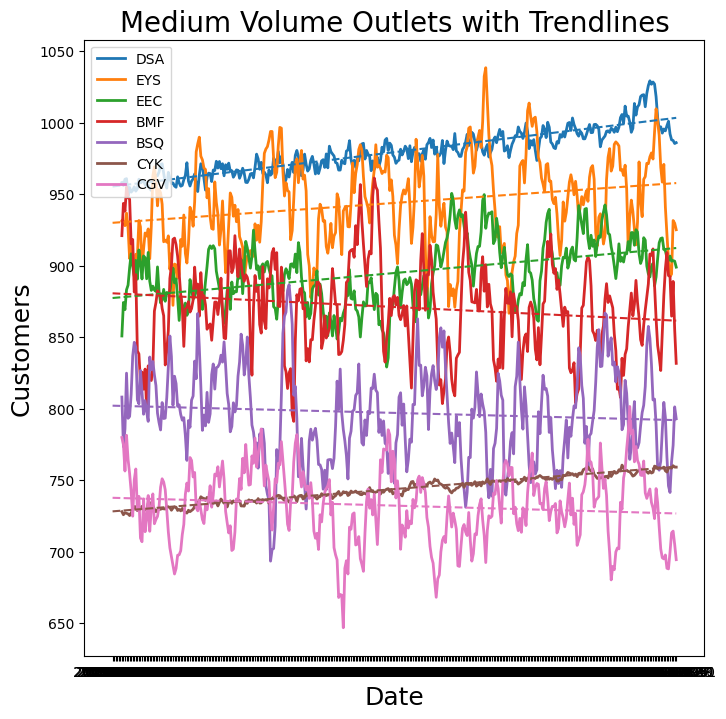

In [35]:

period = 7
rolling_average = data.rolling(window=period).mean()

selected=['DSA', 'EYS', 'EEC','BMF','BSQ','CYK','CGV'] ################################# changed
print(data[selected].head())

plt.figure(figsize=(8, 8))
# plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(data[name]))
    z = np.polyfit(x, data[name], 1)
    trend = np.poly1d(z)
    plt.plot(data.index, trend(x), linestyle='--')
# plt.ylim(ymin=0) ############################################### uncommented
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18) ########################### changed
plt.title('Medium Volume Outlets with Trendlines', fontsize=20) ## changed
plt.legend(selected, loc=2)
plt.show()


scatter plot

             RAN   RFY   DMN   DSA   EYS  EEC  BMF   BSQ  CYK  CGV  ...  YGE  \
Date                                                                ...        
2021-01-01  2322  2374  2004  1086  1102  917  927  1023  830  811  ...   71   
2021-01-02  2034  2070  1549   978   977  939  994   865  779  853  ...   63   
2021-01-03  1655  1835  1010   932   832  835  785   731  710  673  ...   60   
2021-01-04  2039  1813  1456   904   892  776  884   822  639  758  ...   45   
2021-01-05  2006  1996  1412   851   925  734  924   605  643  745  ...   82   

            XSB  HNV  IZX  HTF  ZSJ  YMQ  ZYT  AGN  ZMY  
Date                                                     
2021-01-01    0   72   84   96    0    0   74    0    0  
2021-01-02    0   78   83   91    0    0   61    0    0  
2021-01-03    0   61   68   77    0    0   76    0    0  
2021-01-04    0   73  106   93    0    0   65    0    0  
2021-01-05    0   54   79   69    0    0   80    0    0  

[5 rows x 45 columns]


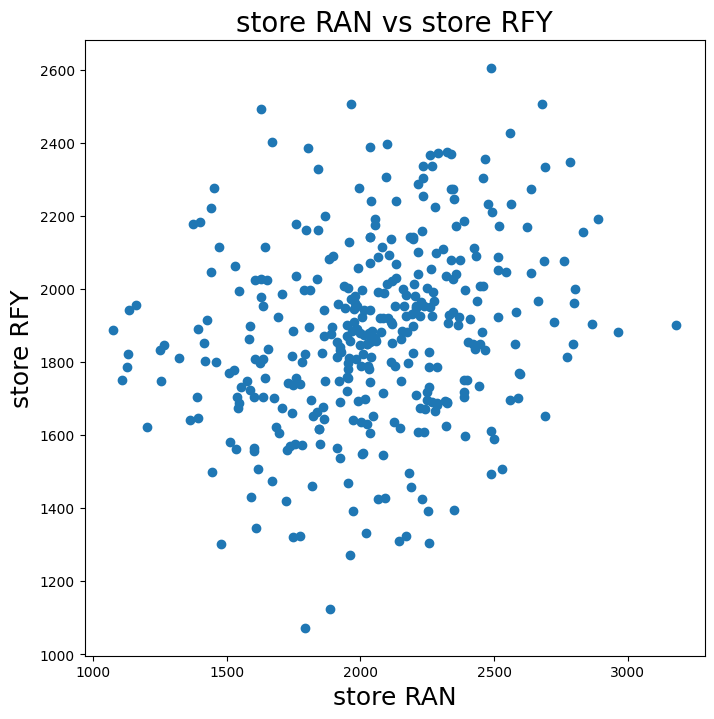

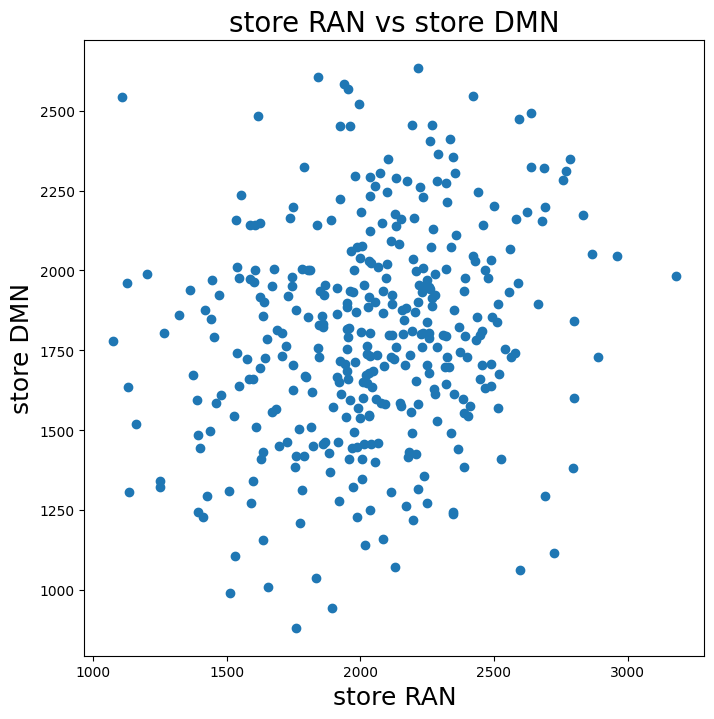

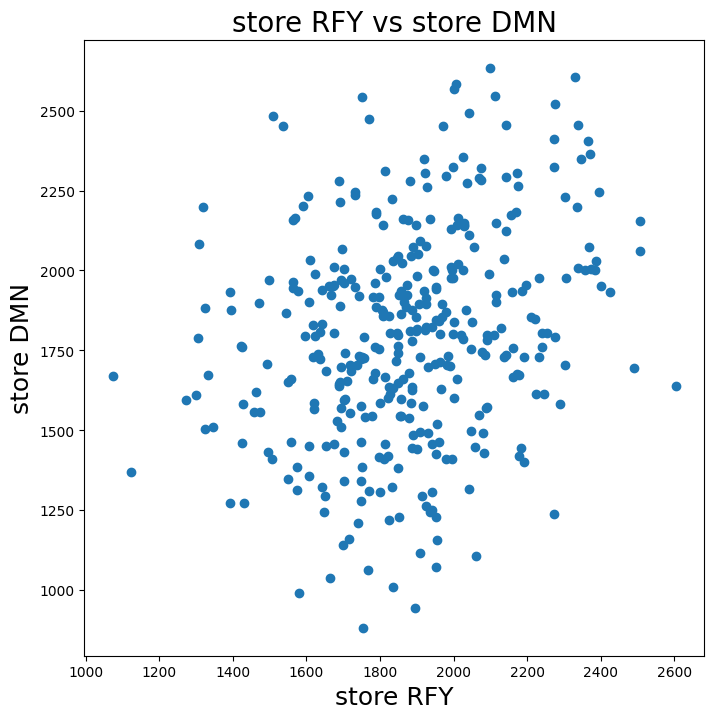

In [36]:
pd.plotting.register_matplotlib_converters()
data.index = pd.to_datetime(data.index)
print(data.head())

selected = ['RAN', 'RFY', 'DMN']

for i, name_i in enumerate(selected):
    for j in range(i + 1, len(selected)):
        name_j = selected[j]
        plt.figure(figsize=(8, 8))
        plt.scatter(data[name_i], data[name_j])
        plt.title('store ' + name_i + ' vs store ' + name_j, fontsize=20)
        plt.xlabel('store ' + name_i, fontsize=18)
        plt.ylabel('store ' + name_j, fontsize=18)
        plt.show()


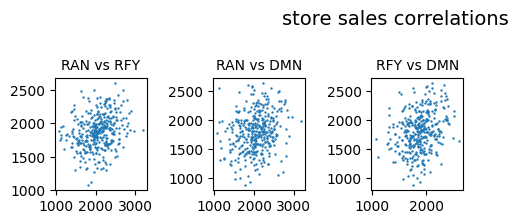

In [37]:
selected = ['RAN', 'RFY', 'DMN']

counter = 1
fig = plt.figure(figsize=(8, 8))
fig.suptitle('store sales correlations', fontsize=14, position=(0.5, 1.0))
for i, name_i in enumerate(selected):
    for j in range(i + 1, len(selected)):
        name_j = selected[j]
        sub = fig.add_subplot(5, 5, counter)
        sub.set_title(name_i + ' vs ' + name_j, fontsize=10)
        sub.scatter(data[name_i], data[name_j], s=0.5)
        counter += 1
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.tight_layout()
plt.show()


heatmap


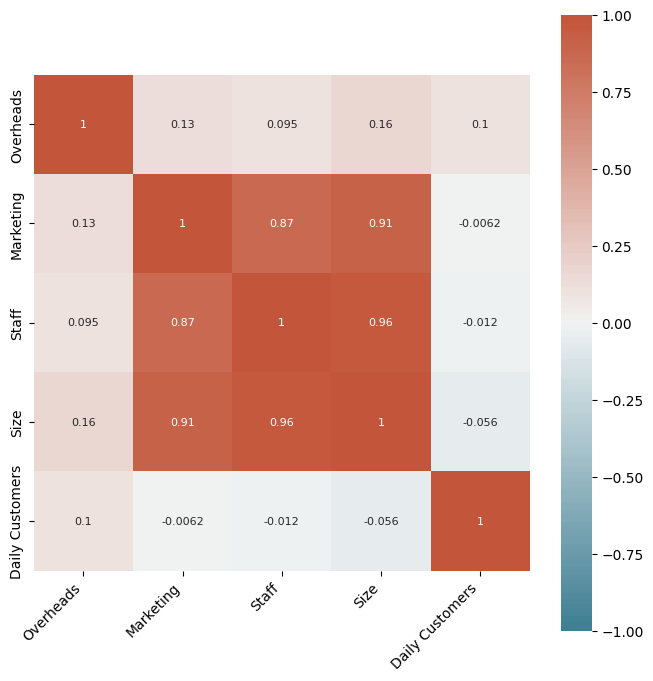

In [38]:
plt.figure(figsize=(8, 8))
corr = summary_data.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()


barcharts subplots for relation between outlets and all the other features

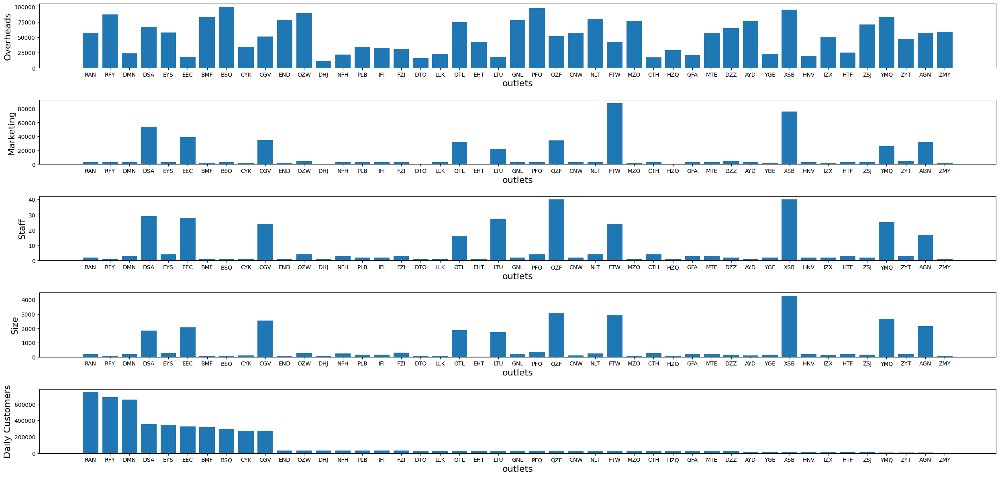

In [39]:
plt.figure(figsize=(25, 12))
counter = 1
x_pos = np.arange(len(summary_data.index))
for attribute in summary_data:
    sub = plt.subplot(5, 1, counter)
    sub.bar(x_pos, summary_data[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels(summary_data.index)
    sub.set_xlabel('outlets', fontsize=16)
    sub.set_ylabel(attribute, fontsize=16)
    counter += 1
plt.tight_layout()
# plt.tight_layout(rect=)
plt.subplots_adjust(hspace=0.5)
plt.show()

comparative barchart high volume

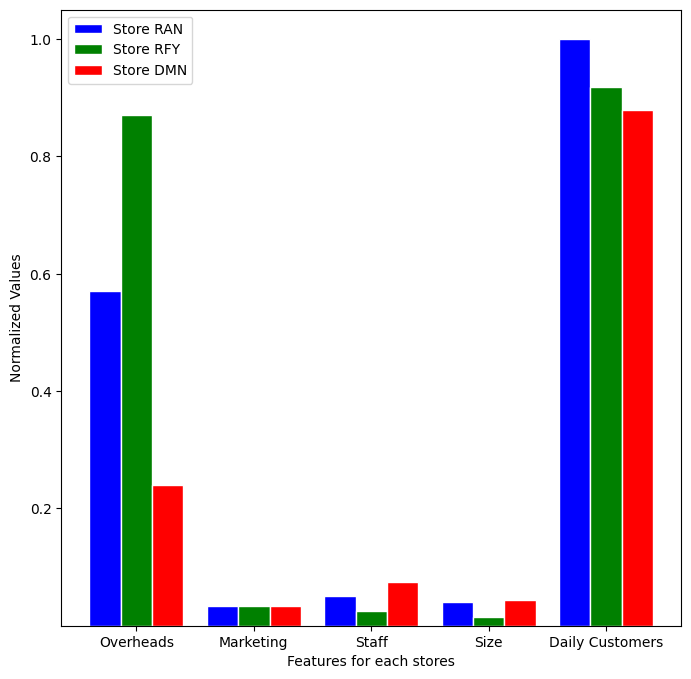

In [40]:
selected = ['RAN', 'RFY', 'DMN']  # high volume
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(8, 8))
c = 0
n_bars = len(selected)
x_pos_base = np.arange(len(summary_data.columns))
bar_width = 0.8 / n_bars
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    x_pos = [x + (bar_width * c) for x in x_pos_base]
    plt.bar(x_pos, values, color=colours[c % len(colours)],
            width=bar_width, edgecolor='white', label='Store ' + name)
    c += 1
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0])
x_pos = [x + (bar_width * (c - 1) / 2) for x in x_pos_base]
plt.xticks(x_pos, summary_data.columns)
plt.legend()
plt.xlabel('Features for each stores')
plt.ylabel('Normalized Values')
plt.show()

radar plot high volume overlaid

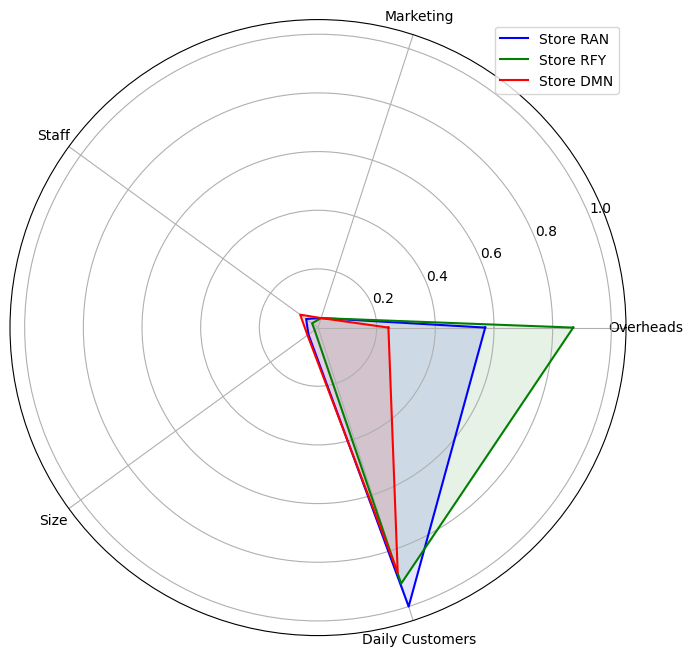

In [41]:
selected = ['RAN', 'RFY', 'DMN']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(8, 8))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)], label='Store ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=1)
plt.show()

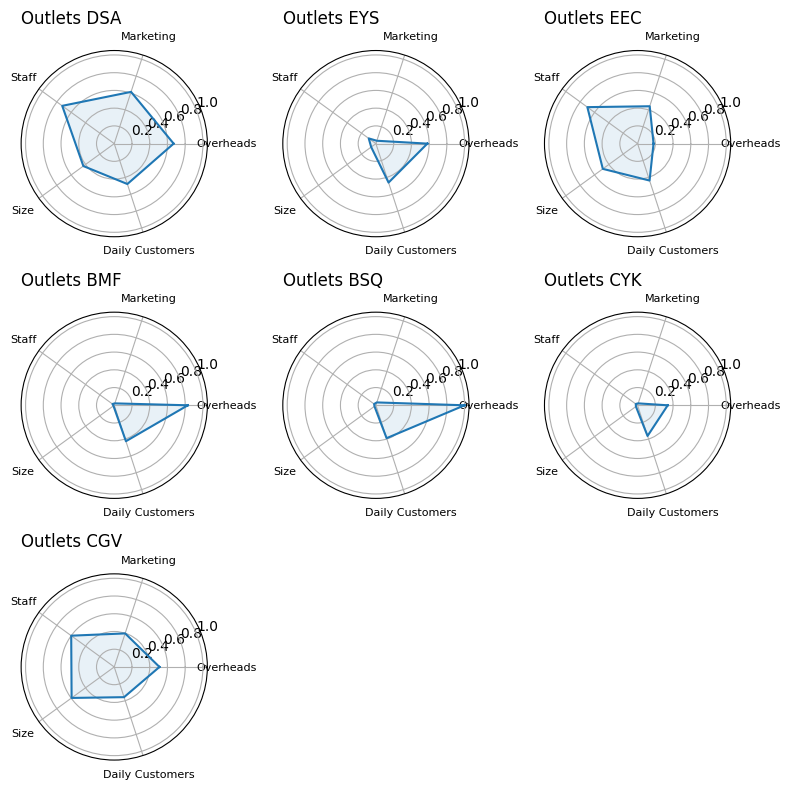

In [42]:
selected=['DSA', 'EYS', 'EEC','BMF','BSQ','CYK','CGV']
n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(8, 8))
counter = 1
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(3,3, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title('Outlets ' + name, fontsize=12, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

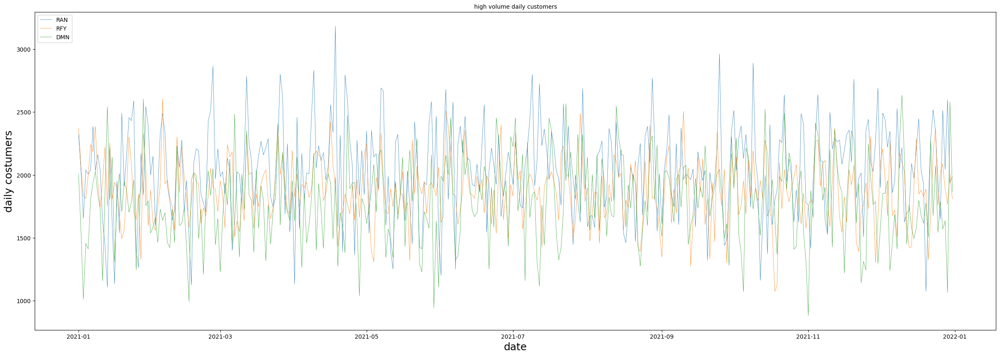

In [43]:
selected = ['RAN', 'RFY', 'DMN']  # high volume
plt.figure(figsize=(30,10))
plt.plot(data[selected], linewidth=0.5)
plt.xlabel('date', fontsize=18)
plt.ylabel('daily costumers', fontsize=18)
plt.title('high volume daily customers', fontsize=10)
plt.legend(data[selected], loc=2)
plt.show()

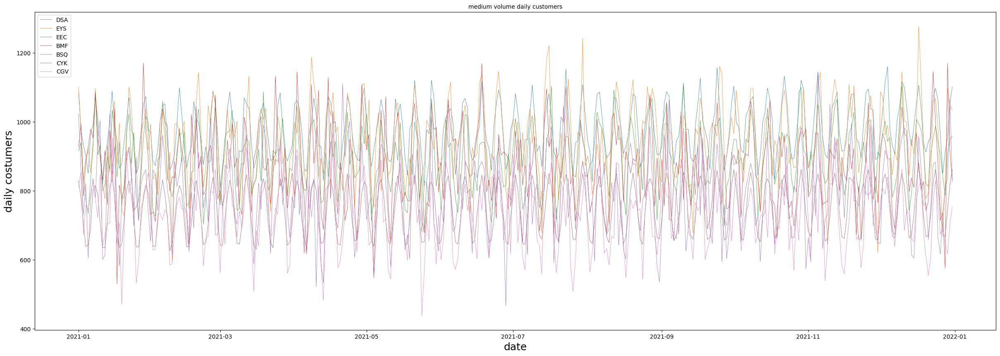

In [44]:
selected=['DSA', 'EYS', 'EEC','BMF','BSQ','CYK','CGV']
plt.figure(figsize=(30,10))
plt.plot(data[selected], linewidth=0.5)
plt.xlabel('date', fontsize=18)
plt.ylabel('daily costumers', fontsize=18)
plt.title('medium volume daily customers', fontsize=10)
plt.legend(data[selected], loc=2)
plt.show()

     Marketing  Staff  Size  Overheads  Daily Customers
RAN       3000      2   172      57000           746060
RFY       3000      1    61      87000           684676
DMN       3000      3   189      24000           656157
DSA      54000     29  1841      67000           357476
EYS       3000      4   282      58000           344517
          Marketing      Staff         Size      Overheads  Daily Customers
count     45.000000  45.000000    45.000000      45.000000        45.000000
mean   11800.000000   7.644444   677.688889   51844.444444    112465.844444
std    19971.115506  11.121551  1051.232455   26288.569548    190171.787291
min     1000.000000   1.000000    16.000000   11000.000000      4376.000000
25%     3000.000000   1.000000    99.000000   25000.000000     21498.000000
50%     3000.000000   2.000000   189.000000   52000.000000     27086.000000
75%     4000.000000   4.000000   292.000000   76000.000000     33328.000000
max    88000.000000  40.000000  4275.000000  100000.0000

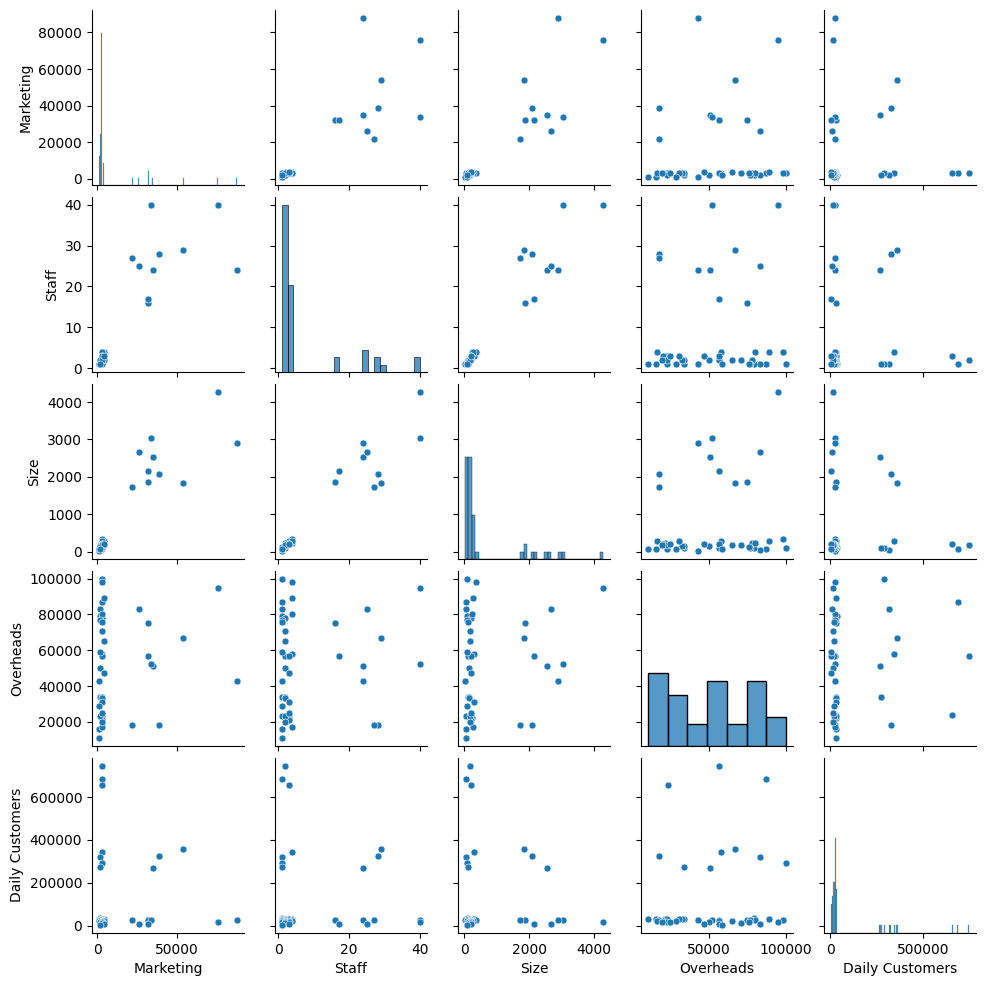

In [45]:

summary_data = pd.DataFrame(index=data.columns)
summary_data['Marketing'] = OutletMarketing_data.values
summary_data['Staff'] = OutletStaff_data.values
summary_data['Size'] = OutletSize_data.values
summary_data['Overheads'] = OutletOverhead_data.values
summary_data['Daily Customers'] = data.sum(axis=0).values
print(summary_data.head())
print(summary_data.describe())

sns.pairplot(summary_data, height=2, plot_kws={'s': 25})
plt.show()


51 bins


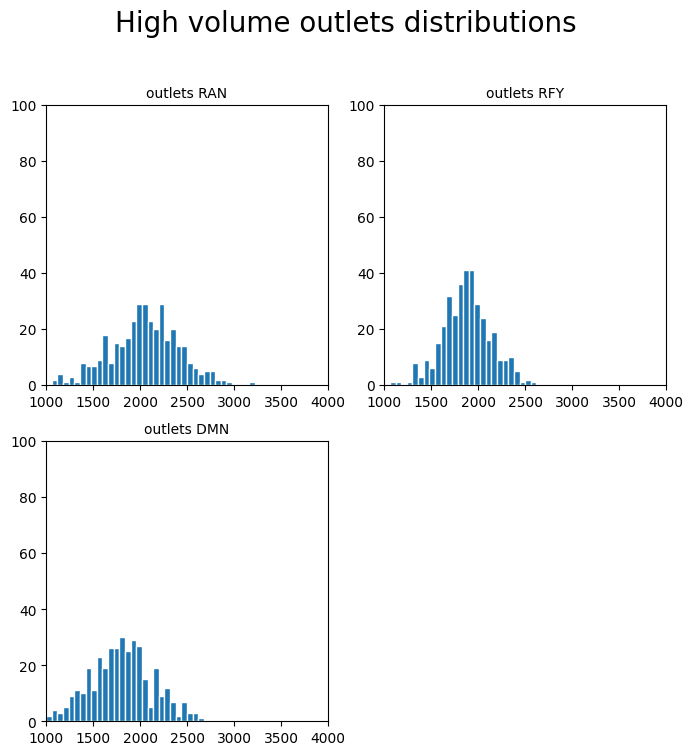

In [46]:
selected = ['RAN', 'RFY', 'DMN']

x_min = 1000
x_max = 4000
bin_width = 60

n_bins = int((bin_width + x_max - x_min) / bin_width)
print(str(n_bins) + ' bins')
bins = [(x_min + x * (bin_width + x_max - x_min) / n_bins) for x in range(int(n_bins))]

fig = plt.figure(figsize=(8, 8))
fig.suptitle('High volume outlets distributions', fontsize=20, position=(0.5, 1.0))
counter = 1
for name in selected:
    sub = fig.add_subplot(2, 2, counter)
    sub.hist(data[name], bins, edgecolor='w')
    sub.set_title('outlets ' + name, fontsize=10)
    sub.set_xlim(xmin=x_min, xmax=x_max)
    sub.set_ylim(ymin=0, ymax=100)
    counter += 1
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

they show the frequency during the year. It shows how many times the daily customers reached those numbers.for example for DMN outlet, daily customers reached 2000 more than 20 times in a year.

34 bins


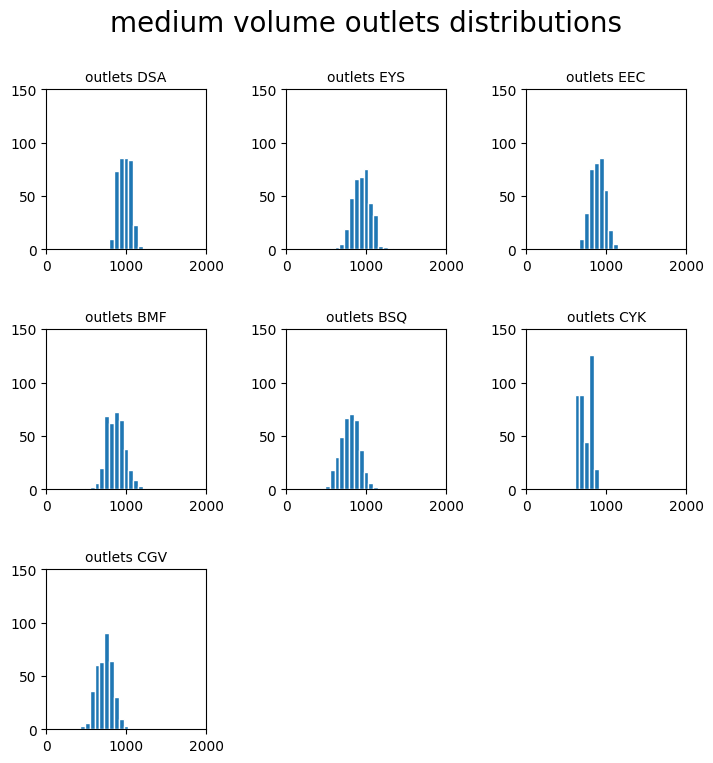

In [47]:
selected=['DSA', 'EYS', 'EEC','BMF','BSQ','CYK','CGV']

x_min = 0
x_max = 2000
bin_width = 60

n_bins = int((bin_width + x_max - x_min) / bin_width)
print(str(n_bins) + ' bins')
bins = [(x_min + x * (bin_width + x_max - x_min) / n_bins) for x in range(int(n_bins))]

fig = plt.figure(figsize=(8, 8))
fig.suptitle('medium volume outlets distributions', fontsize=20, position=(0.5, 1.0))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.5, hspace=0.5)
counter = 1
for name in selected:
    sub = fig.add_subplot(3, 3, counter)
    sub.hist(data[name], bins, edgecolor='w')
    sub.set_title('outlets ' + name, fontsize=10)
    sub.set_xlim(xmin=x_min, xmax=x_max)
    sub.set_ylim(ymin=0, ymax=150)
    counter += 1
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

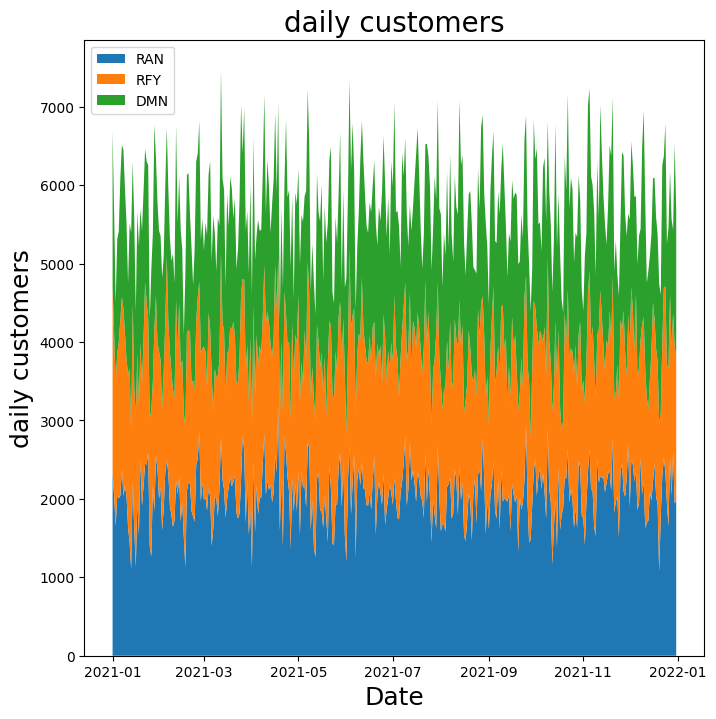

In [48]:
selected = ['RAN', 'RFY', 'DMN']
plt.figure(figsize=(8, 8))
# data.plot.area(figsize=(8, 8))
plt.stackplot(data.index, data[selected].transpose())

plt.xlabel('Date', fontsize=18)
plt.ylabel('daily customers', fontsize=18)
plt.title('daily customers', fontsize=20)
plt.legend(data.columns, loc=2)
plt.show()


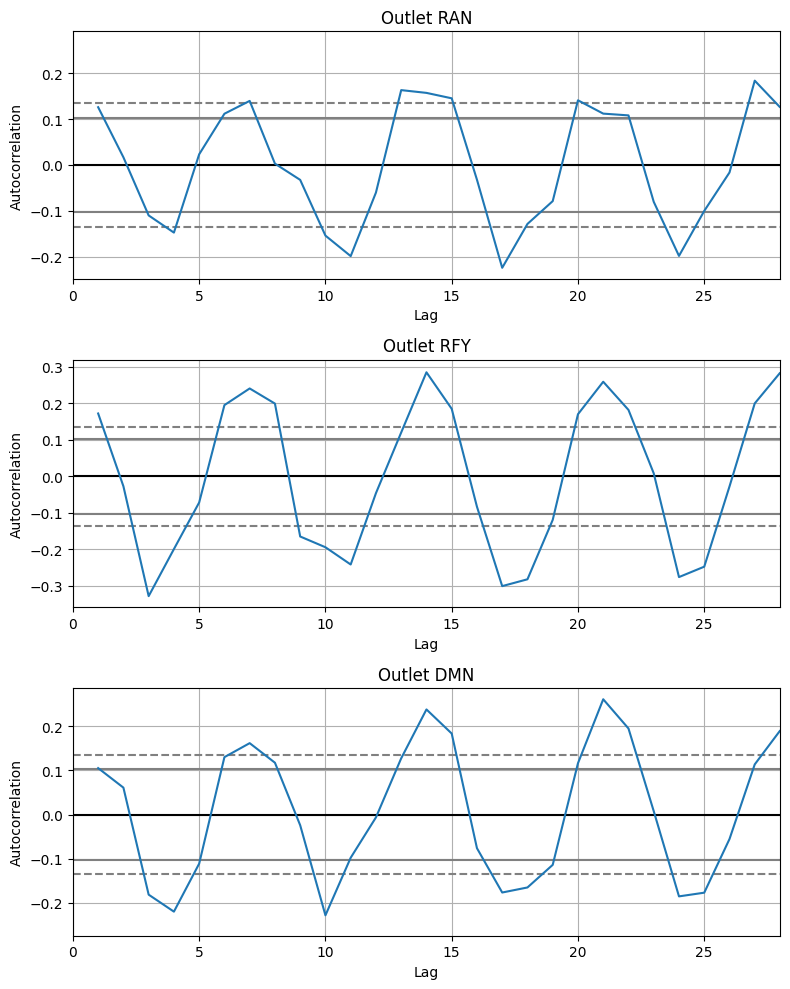

In [49]:
selected = ['RAN', 'RFY', 'DMN']

# Create a figure with subplots
fig, axs = plt.subplots(nrows=len(selected), ncols=1, figsize=(8, 10))

# Loop through each store and plot its autocorrelation plot in a different subplot
for i, name in enumerate(selected):
    pd.plotting.autocorrelation_plot(data[name], ax=axs[i])
    axs[i].set_xlim([0,28])
    axs[i].set_title('Outlet ' + name)

# Adjust the layout of subplots
fig.tight_layout()

# Save the figure as a PNG image
fig.savefig('autocorrelation_plots.png', dpi=300)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
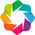

:NdOverlay   [Element]
   :Histogram   [DMN]   (DMN_count)

In [50]:
!pip install hvplot
import pandas as pd
import hvplot.pandas
import holoviews as hv



selected = ['RAN', 'RFY', 'DMN']

plot = data[selected].hvplot.hist(
    frame_height=500, frame_width=500,
    xlabel='outlet sold per day', ylabel='Frequency',
    title='High Volume outlets',
    alpha=0.5, muted_alpha=0, muted_fill_alpha=0, muted_line_alpha=0,
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset']
)
hv.extension('bokeh')
plot


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
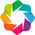

:HeatMap   [columns,index]   (value)

In [51]:
import hvplot.pandas


plot = summary_data.corr().hvplot.heatmap(
    frame_height=500, frame_width=500,
    title=' correlations',
    rot=90, cmap='coolwarm'  # see http://holoviews.org/user_guide/Colormaps.html
).opts(invert_yaxis=True, clim=(-1, 1))
hv.extension('bokeh')
plot


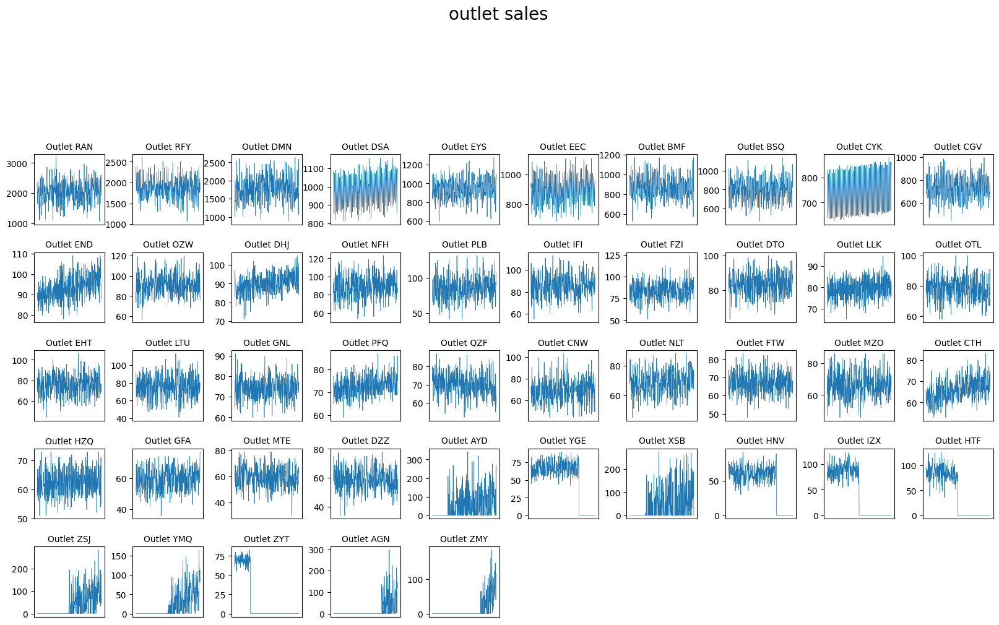

In [52]:
counter = 1
fig = plt.figure(figsize=(20, 20))
fig.suptitle('outlet sales', fontsize=20, position=(0.5, 1.0))
for name in data.columns:
    sub = fig.add_subplot(10, 10, counter)
    sub.set_title('Outlet ' + name, fontsize=10)
    sub.plot(data.index, data[name], linewidth=0.5)
    sub.axes.get_xaxis().set_ticks([])  # remove the x ticks
    counter += 1
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()
